In [2]:
import os
import re 
from pathlib import Path

import pandas as pd
import numpy as np
import scanpy as sc
import scanpy.external as sce
import anndata
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import multiplex_imaging_pipeline.utils as utils

In [4]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['svg.fonttype'] = 'none'

In [5]:
case_order = [
    'HT206B1',
    'HT268B1',
    'HT339B2-H1',
    'HT397B1',
    'HT565B1-H2',
    'HT704B1',
    'HT891Z1',
    'HT913Z1',
    'S18-5591-C8',
    'S18-9906',
]

## collate results by case

In [72]:
multiplex_mapping = {
    'keratin-5': 'ck5',
    'keratin-14': 'ck14',
}
pattern = r'[ -]?\(?[dD]\)?$'
def alter_name(x):
    x = re.sub(pattern, '', x)
    x = x.lower()
    x = x.replace(' ', '-')
    x = multiplex_mapping.get(x, x)
    return x

In [73]:
case_to_fps = {}

In [74]:
directory = Path('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/mushroom')
for case in case_order:
    d = directory / case / 'spatial_features'
    if d.exists():
        fps = [d / name for name in os.listdir(d) if '.txt' in name]
        case_to_fps[case] = fps
directory = Path('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections')
for case in case_order:
    d = directory / case
    if d.exists():
        fps = [d / name for name in os.listdir(d) if '.txt' in name]
        case_to_fps[case] = fps

In [77]:
for case, fps in case_to_fps.items():
    print(case)
    
    stacked = []
    for fp in fps:
        sid = fp.name.replace('_spatial_features.txt', '')
        df = pd.read_csv(fp, sep='\t')
        df.index = [f'{sid}_{x}' for x in df['label'].to_list()]
        df['sid'] = sid
        df['case'] = case
        cols = ['case', 'sid', 'label', 'row', 'col']
        cols += [c for c in df.columns if 'bbox' in c]
        marker_cols = [c for c in df.columns if c[-10:] == '_intensity']

        df = df[cols + marker_cols]    
        renamed_cols = [alter_name(x.replace('_intensity', '')) + '_intensity' for x in marker_cols]
        df.columns = cols + renamed_cols
        
        df.index.name = 'cell_id'

        stacked.append(df)
    combined = pd.concat(stacked)
    
    combined.to_csv(f'/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/{case}.txt', sep='\t')
    
    

HT206B1
HT339B2-H1
HT397B1
HT565B1-H2
S18-5591-C8
S18-9906
HT704B1
HT891Z1
HT913Z1


## cell typing by case

In [6]:
directory = Path('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections')
case_to_fp = {name.replace('.txt', ''):directory / name for name in os.listdir(directory) if '.txt' in name}
case_to_fp

{'HT206B1': PosixPath('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT206B1.txt'),
 'HT339B2-H1': PosixPath('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT339B2-H1.txt'),
 'HT397B1': PosixPath('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT397B1.txt'),
 'HT565B1-H2': PosixPath('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT565B1-H2.txt'),
 'S18-5591-C8': PosixPath('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/S18-5591-C8.txt'),
 'S18-9906': PosixPath('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/S18-9906.txt'),
 'HT704B1': PosixPath('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT704B1.txt'),
 'HT891Z1': PosixPath('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT891Z1.txt'),
 'HT913Z1': PosixPath('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sec

In [7]:
output_dir = directory / 'cell_typed'
output_dir.mkdir(parents=True, exist_ok=True)

In [106]:
from sklearn.cluster import KMeans
for case in case_to_fp.keys():
    print(case)
    df = pd.read_csv(case_to_fp[case], index_col=0, sep='\t')

    marker_cols = [c for c in df.columns if '_intensity' in c]
    adata = anndata.AnnData(X=df[marker_cols], obs=df[[c for c in df.columns if c not in marker_cols]])
    adata.var.index = [c.replace('_intensity', '') for c in marker_cols]
    adata.raw = adata
    sc.pp.scale(adata)
    
    down = adata[:, pd.isnull(adata.X).sum(0) == 0]
    
    sc.pp.pca(down, n_comps=10)
    sce.pp.harmony_integrate(down, 'sid', max_iter_harmony=2)
    adata.obsm['X_pca'] = down.obsm['X_pca']
    adata.obsm['X_pca_harmony'] = down.obsm['X_pca_harmony']
    
    clf = KMeans(n_clusters=25)
    preds = clf.fit_predict(adata.obsm['X_pca_harmony'])
    adata.obs['cluster'] = [str(x) for x in preds]

    adata.write_h5ad(output_dir / f'{case}_processed.h5ad')

HT206B1


/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca
2024-11-04 15:24:31,599 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-04 15:25:21,645 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-04 15:25:26,867 - harmonypy - INFO - Iteration 1 of 2
2024-11-04 15:33:07,593 - harmonypy - INFO - Iteration 2 of 2
2024-11-04 15:40:51,107 - harmonypy - INFO - Stopped before convergence
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


HT339B2-H1


/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca
2024-11-04 15:41:17,351 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-04 15:41:22,905 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-04 15:41:23,308 - harmonypy - INFO - Iteration 1 of 2
2024-11-04 15:41:39,714 - harmonypy - INFO - Iteration 2 of 2
2024-11-04 15:41:55,009 - harmonypy - INFO - Stopped before convergence
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


HT397B1


/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca
2024-11-04 15:42:05,739 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-04 15:43:08,291 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-04 15:43:14,121 - harmonypy - INFO - Iteration 1 of 2
2024-11-04 15:52:14,256 - harmonypy - INFO - Iteration 2 of 2
2024-11-04 16:00:59,136 - harmonypy - INFO - Stopped before convergence
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


HT565B1-H2


/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca
2024-11-04 16:01:26,595 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-04 16:01:34,774 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-04 16:01:35,569 - harmonypy - INFO - Iteration 1 of 2
2024-11-04 16:02:11,945 - harmonypy - INFO - Iteration 2 of 2
2024-11-04 16:02:51,273 - harmonypy - INFO - Stopped before convergence
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


S18-5591-C8


/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca
2024-11-04 16:03:14,264 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-04 16:05:32,653 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-04 16:05:48,434 - harmonypy - INFO - Iteration 1 of 2
2024-11-04 16:30:47,548 - harmonypy - INFO - Iteration 2 of 2
2024-11-04 16:55:21,842 - harmonypy - INFO - Stopped before convergence
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


S18-9906


/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca
2024-11-04 16:56:29,382 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-04 16:58:04,165 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-04 16:58:13,708 - harmonypy - INFO - Iteration 1 of 2
2024-11-04 17:13:31,004 - harmonypy - INFO - Iteration 2 of 2
2024-11-04 17:26:53,065 - harmonypy - INFO - Stopped before convergence
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


HT704B1


/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca
2024-11-04 17:27:54,713 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-04 17:30:38,222 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-04 17:30:53,521 - harmonypy - INFO - Iteration 1 of 2
2024-11-04 17:54:46,848 - harmonypy - INFO - Iteration 2 of 2
2024-11-04 18:18:05,305 - harmonypy - INFO - Stopped before convergence
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


HT891Z1


/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca
2024-11-04 18:19:32,543 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-04 18:23:21,353 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-04 18:23:43,858 - harmonypy - INFO - Iteration 1 of 2
2024-11-04 19:02:15,374 - harmonypy - INFO - Iteration 2 of 2
2024-11-04 19:40:48,532 - harmonypy - INFO - Stopped before convergence
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


HT913Z1


/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca
2024-11-04 19:43:11,412 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-04 19:49:17,252 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-04 19:49:52,076 - harmonypy - INFO - Iteration 1 of 2
2024-11-04 20:47:08,502 - harmonypy - INFO - Iteration 2 of 2
2024-11-04 21:44:55,514 - harmonypy - INFO - Stopped before convergence
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [8]:
genes = [
    'cd31',
    'cd45',
    'hla-dr',
    'cd20',
    'cd3e',
    'cd4',
    'cd8',
    'cd68',
    'ck5',
    'ck14',
    'e-cadherin',
    'pan-cytokeratin',
    'sma',
    'vimentin'
]

#### HT206B1

In [107]:
case = 'HT206B1'

adata = sc.read_h5ad(output_dir / f'{case}_processed.h5ad')
adata

AnnData object with n_obs × n_vars = 576826 × 39
    obs: 'case', 'sid', 'label', 'row', 'col', 'bbox-r1', 'bbox-c1', 'bbox-r2', 'bbox-c2', 'cluster'
    var: 'mean', 'std'
    obsm: 'X_pca', 'X_pca_harmony'

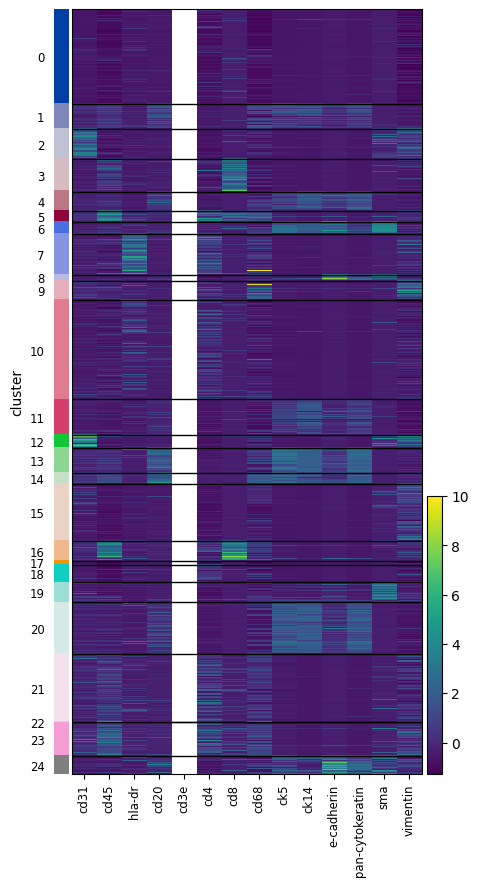

In [108]:
sc.pl.heatmap(adata, [g for g in genes if g in adata.var.index], groupby='cluster', vmax=10, figsize=(5, 10))

In [ ]:
# Treg	T cell	Fibroblast	Macrophage	Epithelial	pDC	Endothelial	NK cell	Mast	Plasma	B cell	Pericyte	cDC	mregDC

In [126]:
mapping = {
    'Epithelial': [1, 4, 6, 8, 11, 13, 14, 20, 24],
    'T cell': [3, 16, 5],
    'Fibroblast': [19, 15],
    'Macrophage': [9, 7, 21, 18, 10, 23],
    'Endothelial': [2, 12],
    'Unknown': [0, 17, 22],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
adata.obs['cell_type'] = [r_mapping[int(x)] for x in adata.obs['cluster']]

In [127]:
sids

['HT206B1-H2L1-U10',
 'HT206B1-H2L1-U13',
 'HT206B1-H2L1-U18',
 'HT206B1-H2L1-U2',
 'HT206B1-H2L1-U21',
 'HT206B1-H2L1-U5']

/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/esto

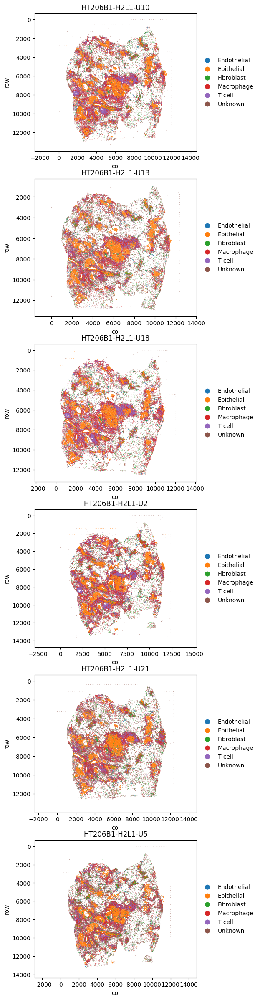

In [128]:
sids = sorted(set(adata.obs['sid']))
fig, axs = plt.subplots(nrows=len(sids), figsize=(5, 5 * len(sids)))
for sid, ax in zip(sids, axs):
    f = adata[adata.obs['sid']==sid]
    sc.pl.scatter(f, x='col', y='row', color='cell_type', ax=ax, show=False)
    ax.axis('equal')
    ax.invert_yaxis()
    ax.set_title(sid)
plt.savefig(output_dir / f'{case}_sections.svg')

In [129]:
adata.write_h5ad(output_dir / f'{case}_cell_typed.h5ad')

In [131]:
output_dir

PosixPath('/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/cell_typed')

#### HT339B2-H1

In [132]:
case = 'HT339B2-H1'

adata = sc.read_h5ad(output_dir / f'{case}_processed.h5ad')
adata

AnnData object with n_obs × n_vars = 38822 × 33
    obs: 'case', 'sid', 'label', 'row', 'col', 'bbox-r1', 'bbox-c1', 'bbox-r2', 'bbox-c2', 'cluster'
    var: 'mean', 'std'
    obsm: 'X_pca', 'X_pca_harmony'

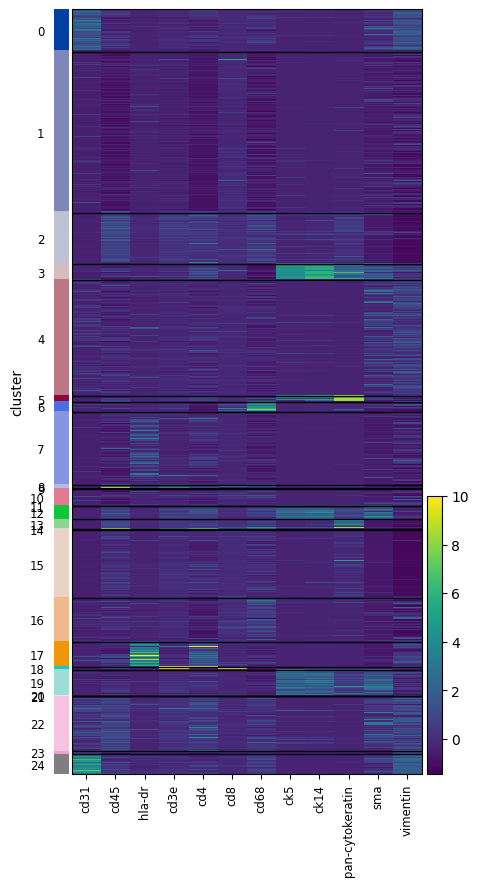

In [133]:
sc.pl.heatmap(adata, [g for g in genes if g in adata.var.index], groupby='cluster', vmax=10, figsize=(5, 10))

In [147]:
mapping = {
    'Epithelial': [3, 5, 12, 13, 19, 2, 15],
    'T cell': [8, 9],
    'Fibroblast': [4],
    'Macrophage': [6, 17],
    'Endothelial': [0, 24],
    'Unknown': [1, 7, 10, 16, 22, 23, 18, 20, 21, 14, 11],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
adata.obs['cell_type'] = [r_mapping[int(x)] for x in adata.obs['cluster']]

In [148]:
sids = sorted(set(adata.obs['sid']))
sids

['HT339B2-H1']

/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


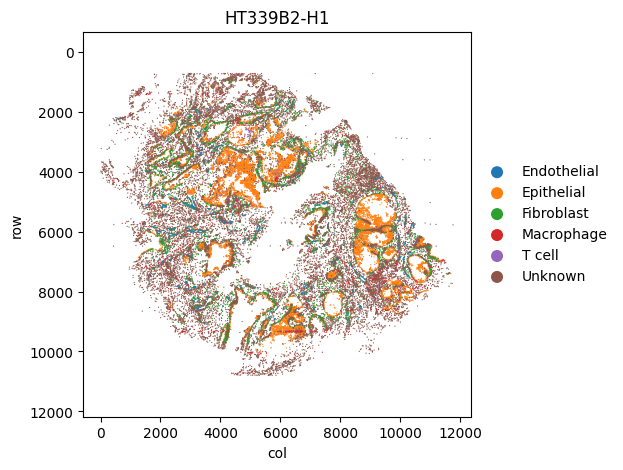

In [149]:
fig, axs = plt.subplots(nrows=len(sids), figsize=(5, 5 * len(sids)))
if len(sids) < 2:
    axs = [axs]
for sid, ax in zip(sids, axs):
    f = adata[adata.obs['sid']==sid]
    sc.pl.scatter(f, x='col', y='row', color='cell_type', ax=ax, show=False)
    ax.axis('equal')
    ax.invert_yaxis()
    ax.set_title(sid)
plt.savefig(output_dir / f'{case}_sections.svg')

In [150]:
adata.write_h5ad(output_dir / f'{case}_cell_typed.h5ad')

#### HT397B1

In [151]:
case = 'HT397B1'

adata = sc.read_h5ad(output_dir / f'{case}_processed.h5ad')
adata

AnnData object with n_obs × n_vars = 657740 × 28
    obs: 'case', 'sid', 'label', 'row', 'col', 'bbox-r1', 'bbox-c1', 'bbox-r2', 'bbox-c2', 'cluster'
    var: 'mean', 'std'
    obsm: 'X_pca', 'X_pca_harmony'

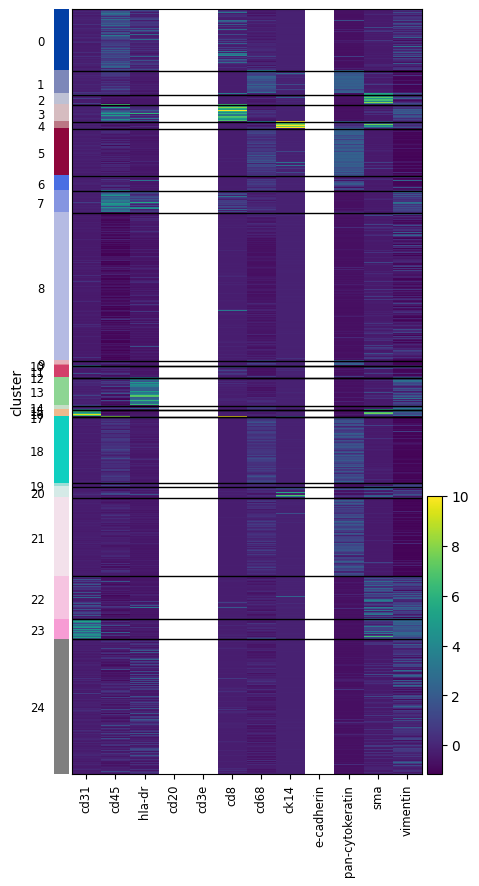

In [152]:
sc.pl.heatmap(adata, [g for g in genes if g in adata.var.index], groupby='cluster', vmax=10, figsize=(5, 10))

In [166]:
mapping = {
    'Epithelial': [1, 5, 6, 18, 21, 9],
    'T cell': [0, 3, 7],
    'Fibroblast': [22, 2, 4, 20, 24],
    'Macrophage': [7, 13],
    'Endothelial': [16, 17, 23],
    'Unknown': [8, 11, 19, 14, 15, 12, 10],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
adata.obs['cell_type'] = [r_mapping[int(x)] for x in adata.obs['cluster']]

In [167]:
sids = sorted(set(adata.obs['sid']))
sids

['HT397B1-S1H3A1-U12',
 'HT397B1-S1H3A1-U2',
 'HT397B1-S1H3A1-U22',
 'HT397B1-S1H3A1-U31']

/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


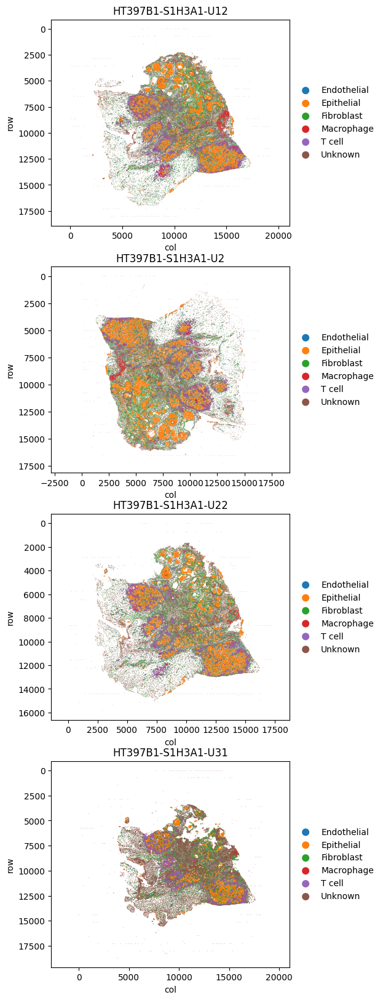

In [168]:
fig, axs = plt.subplots(nrows=len(sids), figsize=(5, 5 * len(sids)))
if len(sids) < 2:
    axs = [axs]
for sid, ax in zip(sids, axs):
    f = adata[adata.obs['sid']==sid]
    sc.pl.scatter(f, x='col', y='row', color='cell_type', ax=ax, show=False)
    ax.axis('equal')
    ax.invert_yaxis()
    ax.set_title(sid)
plt.savefig(output_dir / f'{case}_sections.svg')

In [169]:
adata.write_h5ad(output_dir / f'{case}_cell_typed.h5ad')

#### HT704B1

In [170]:
case = 'HT704B1'

adata = sc.read_h5ad(output_dir / f'{case}_processed.h5ad')
adata

AnnData object with n_obs × n_vars = 1567850 × 38
    obs: 'case', 'sid', 'label', 'row', 'col', 'bbox-r1', 'bbox-c1', 'bbox-r2', 'bbox-c2', 'cluster'
    var: 'mean', 'std'
    obsm: 'X_pca', 'X_pca_harmony'

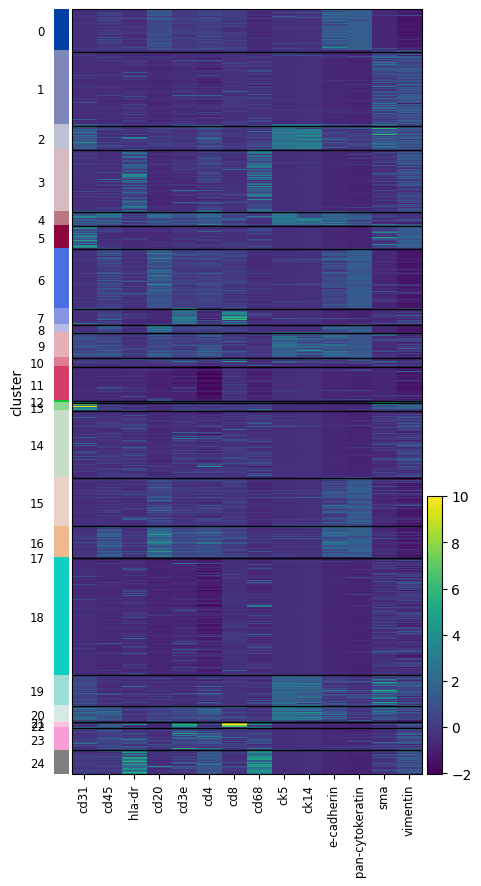

In [171]:
sc.pl.heatmap(adata, [g for g in genes if g in adata.var.index], groupby='cluster', vmax=10, figsize=(5, 10))

In [181]:
mapping = {
    'Epithelial': [0, 6, 9, 15, 16, 8],
    'T cell': [7, 21, 22, 23],
    'Fibroblast': [1, 19, 2, 20],
    'Macrophage': [3, 24],
    'Endothelial': [13, 5],
    'Unknown': [4, 12, 18, 11, 14, 10, 17],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
adata.obs['cell_type'] = [r_mapping[int(x)] for x in adata.obs['cluster']]

In [182]:
sids = sorted(set(adata.obs['sid']))
sids

['HT704B1_U11',
 'HT704B1_U19',
 'HT704B1_U27',
 'HT704B1_U35',
 'HT704B1_U43',
 'HT704B1_U53',
 'HT704B1_U60',
 'HT704B1_U68',
 'HT704B1_U76',
 'HT704B1_U82',
 'HT704B1_U85',
 'HT704B1_U91']

/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/esto

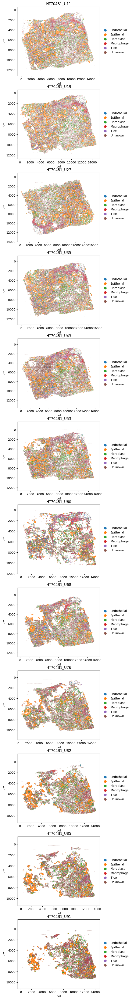

In [183]:
fig, axs = plt.subplots(nrows=len(sids), figsize=(5, 5 * len(sids)))
if len(sids) < 2:
    axs = [axs]
for sid, ax in zip(sids, axs):
    f = adata[adata.obs['sid']==sid]
    sc.pl.scatter(f, x='col', y='row', color='cell_type', ax=ax, show=False)
    ax.axis('equal')
    ax.invert_yaxis()
    ax.set_title(sid)
plt.savefig(output_dir / f'{case}_sections.svg')

In [184]:
adata.write_h5ad(output_dir / f'{case}_cell_typed.h5ad')

#### HT891Z1

In [185]:
case = 'HT891Z1'

adata = sc.read_h5ad(output_dir / f'{case}_processed.h5ad')
adata

AnnData object with n_obs × n_vars = 2511647 × 25
    obs: 'case', 'sid', 'label', 'row', 'col', 'bbox-r1', 'bbox-c1', 'bbox-r2', 'bbox-c2', 'cluster'
    var: 'mean', 'std'
    obsm: 'X_pca', 'X_pca_harmony'

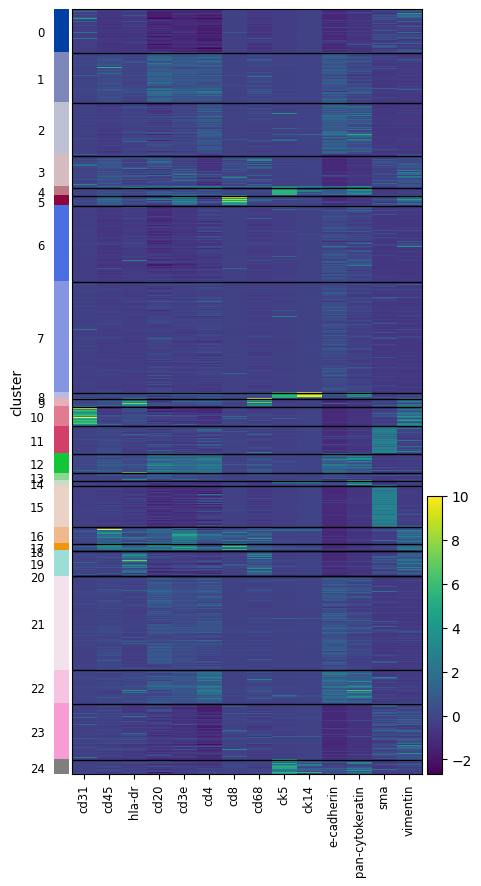

In [186]:
sc.pl.heatmap(adata, [g for g in genes if g in adata.var.index], groupby='cluster', vmax=10, figsize=(5, 10))

In [193]:
mapping = {
    'Epithelial': [2, 4, 8, 12, 14, 22, 24, 6, 7, 21],
    'T cell': [1, 5, 16, 17, 18],
    'Fibroblast': [11, 15, 23],
    'Macrophage': [9, 19, 3],
    'Endothelial': [10],
    'Unknown': [0, 13, 20],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
adata.obs['cell_type'] = [r_mapping[int(x)] for x in adata.obs['cluster']]

In [194]:
sids = sorted(set(adata.obs['sid']))
sids

['HT891Z1-S2H3Fp1_U103',
 'HT891Z1-S2H3Fp1_U108',
 'HT891Z1-S2H3Fp1_U109',
 'HT891Z1-S2H3Fp1_U110',
 'HT891Z1-S2H3Fp1_U111',
 'HT891Z1-S2H3Fp1_U113',
 'HT891Z1-S2H3Fp1_U14',
 'HT891Z1-S2H3Fp1_U31',
 'HT891Z1-S2H3Fp1_U40',
 'HT891Z1-S2H3Fp1_U41',
 'HT891Z1-S2H3Fp1_U43',
 'HT891Z1-S2H3Fp1_U45',
 'HT891Z1-S2H3Fp1_U46',
 'HT891Z1-S2H3Fp1_U58',
 'HT891Z1-S2H3Fp1_U79',
 'HT891Z1-S2H3Fp1_U93']

/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/esto

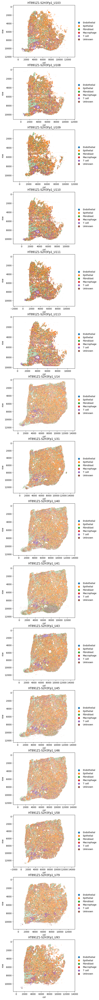

In [195]:
fig, axs = plt.subplots(nrows=len(sids), figsize=(5, 5 * len(sids)))
if len(sids) < 2:
    axs = [axs]
for sid, ax in zip(sids, axs):
    f = adata[adata.obs['sid']==sid]
    sc.pl.scatter(f, x='col', y='row', color='cell_type', ax=ax, show=False)
    ax.axis('equal')
    ax.invert_yaxis()
    ax.set_title(sid)
plt.savefig(output_dir / f'{case}_sections.svg')

In [196]:
adata.write_h5ad(output_dir / f'{case}_cell_typed.h5ad')

#### HT913Z1

In [197]:
case = 'HT913Z1'

adata = sc.read_h5ad(output_dir / f'{case}_processed.h5ad')
adata

AnnData object with n_obs × n_vars = 3681323 × 25
    obs: 'case', 'sid', 'label', 'row', 'col', 'bbox-r1', 'bbox-c1', 'bbox-r2', 'bbox-c2', 'cluster'
    var: 'mean', 'std'
    obsm: 'X_pca', 'X_pca_harmony'

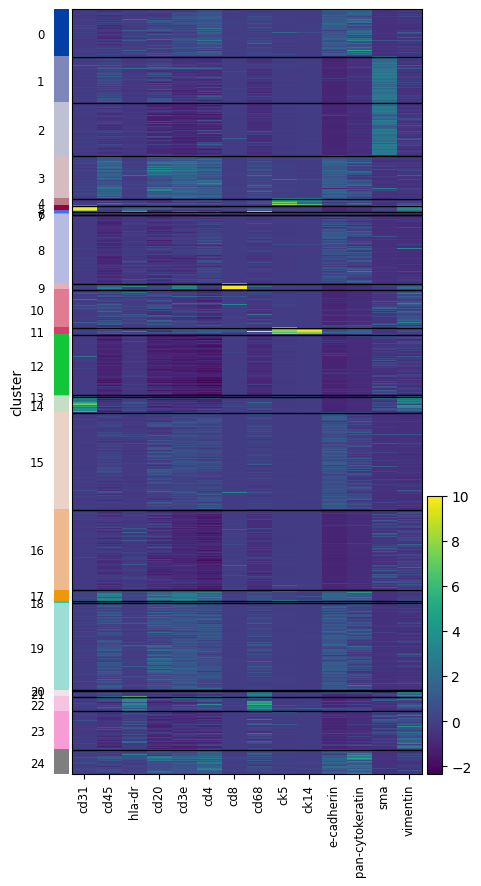

In [198]:
sc.pl.heatmap(adata, [g for g in genes if g in adata.var.index], groupby='cluster', vmax=10, figsize=(5, 10))

In [201]:
mapping = {
    'Epithelial': [0, 8, 11, 4, 15, 19, 24],
    'T cell': [3, 9, 17],
    'Fibroblast': [1, 2, 16, 23],
    'Macrophage': [6, 20, 21, 22],
    'Endothelial': [5, 14],
    'Unknown': [10, 12, 18, 7, 13],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
adata.obs['cell_type'] = [r_mapping[int(x)] for x in adata.obs['cluster']]

In [202]:
sids = sorted(set(adata.obs['sid']))
sids

['HT913Z1-S2H1FP1_U102',
 'HT913Z1-S2H1FP1_U111',
 'HT913Z1-S2H1FP1_U12',
 'HT913Z1-S2H1FP1_U121',
 'HT913Z1-S2H1FP1_U125',
 'HT913Z1-S2H1FP1_U2',
 'HT913Z1-S2H1FP1_U22',
 'HT913Z1-S2H1FP1_U41',
 'HT913Z1-S2H1FP1_U51',
 'HT913Z1-S2H1FP1_U52',
 'HT913Z1-S2H1FP1_U53',
 'HT913Z1-S2H1FP1_U54',
 'HT913Z1-S2H1FP1_U62',
 'HT913Z1-S2H1FP1_U71',
 'HT913Z1-S2H1FP1_U82',
 'HT913Z1-S2H1FP1_U91']

/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/esto

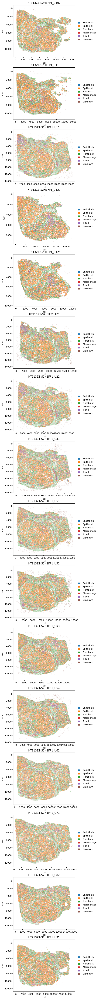

In [203]:
fig, axs = plt.subplots(nrows=len(sids), figsize=(5, 5 * len(sids)))
if len(sids) < 2:
    axs = [axs]
for sid, ax in zip(sids, axs):
    f = adata[adata.obs['sid']==sid]
    sc.pl.scatter(f, x='col', y='row', color='cell_type', ax=ax, show=False)
    ax.axis('equal')
    ax.invert_yaxis()
    ax.set_title(sid)
plt.savefig(output_dir / f'{case}_sections.svg')

In [204]:
adata.write_h5ad(output_dir / f'{case}_cell_typed.h5ad')

#### S18-5591-C8

In [205]:
case = 'S18-5591-C8'

adata = sc.read_h5ad(output_dir / f'{case}_processed.h5ad')
adata

AnnData object with n_obs × n_vars = 1710568 × 24
    obs: 'case', 'sid', 'label', 'row', 'col', 'bbox-r1', 'bbox-c1', 'bbox-r2', 'bbox-c2', 'cluster'
    var: 'mean', 'std'
    obsm: 'X_pca', 'X_pca_harmony'

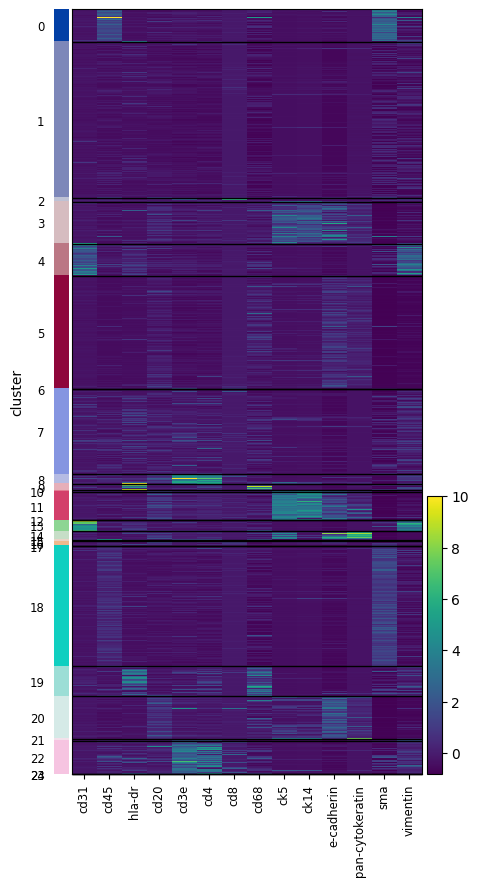

In [206]:
sc.pl.heatmap(adata, [g for g in genes if g in adata.var.index], groupby='cluster', vmax=10, figsize=(5, 10))

In [208]:
mapping = {
    'Epithelial': [3, 11, 14, 20, 5],
    'T cell': [8, 22],
    'Fibroblast': [18, 0],
    'Macrophage': [19, 9, 10],
    'Endothelial': [4, 13],
    'Unknown': [1, 2, 7, 6, 10, 12, 15, 16, 17, 23, 24, 21],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
adata.obs['cell_type'] = [r_mapping[int(x)] for x in adata.obs['cluster']]

In [209]:
sids = sorted(set(adata.obs['sid']))
sids

['S18-5591-U14',
 'S18-5591-U19',
 'S18-5591-U2',
 'S18-5591-U21',
 'S18-5591-U23',
 'S18-5591-U24',
 'S18-5591-U6',
 'S18-5591-U8']

/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/esto

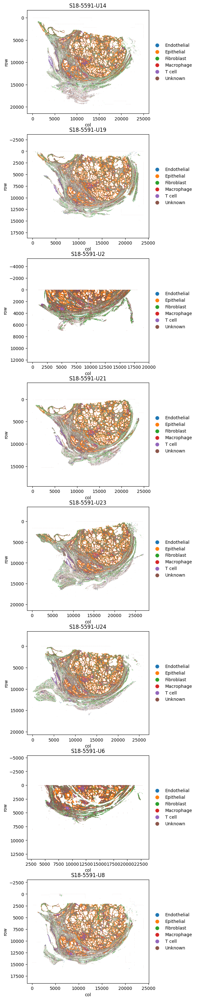

In [210]:
fig, axs = plt.subplots(nrows=len(sids), figsize=(5, 5 * len(sids)))
if len(sids) < 2:
    axs = [axs]
for sid, ax in zip(sids, axs):
    f = adata[adata.obs['sid']==sid]
    sc.pl.scatter(f, x='col', y='row', color='cell_type', ax=ax, show=False)
    ax.axis('equal')
    ax.invert_yaxis()
    ax.set_title(sid)
plt.savefig(output_dir / f'{case}_sections.svg')

In [211]:
adata.write_h5ad(output_dir / f'{case}_cell_typed.h5ad')

#### S18-9906

In [212]:
case = 'S18-9906'

adata = sc.read_h5ad(output_dir / f'{case}_processed.h5ad')
adata

AnnData object with n_obs × n_vars = 1017529 × 24
    obs: 'case', 'sid', 'label', 'row', 'col', 'bbox-r1', 'bbox-c1', 'bbox-r2', 'bbox-c2', 'cluster'
    var: 'mean', 'std'
    obsm: 'X_pca', 'X_pca_harmony'

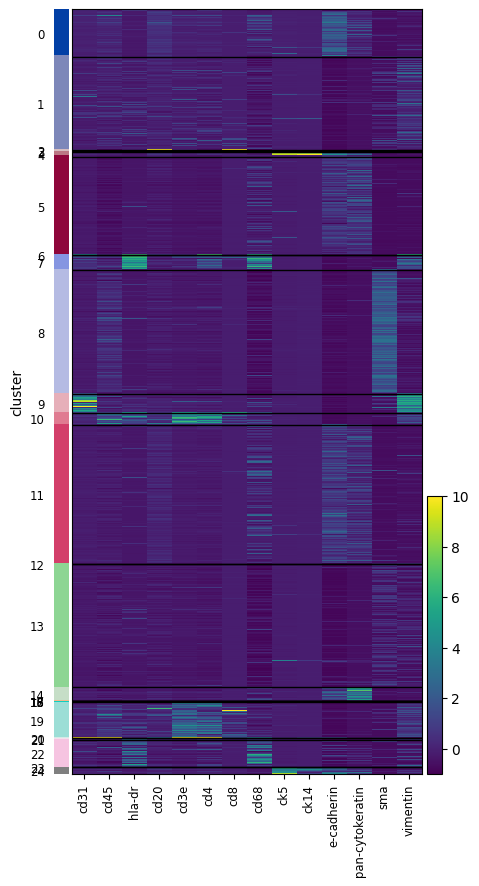

In [213]:
sc.pl.heatmap(adata, [g for g in genes if g in adata.var.index], groupby='cluster', vmax=10, figsize=(5, 10))

In [215]:
mapping = {
    'Epithelial': [0, 4, 5, 11, 14, 24],
    'T cell': [19, 10],
    'Fibroblast': [8, 13],
    'Macrophage': [7, 22],
    'Endothelial': [9],
    'Unknown': [1, 2, 3, 6, 12, 15, 16, 17, 18, 20, 21, 23],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
adata.obs['cell_type'] = [r_mapping[int(x)] for x in adata.obs['cluster']]

In [216]:
sids = sorted(set(adata.obs['sid']))
sids

['S18-9906-U10', 'S18-9906-U18', 'S18-9906-U25', 'S18-9906-U3']

/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


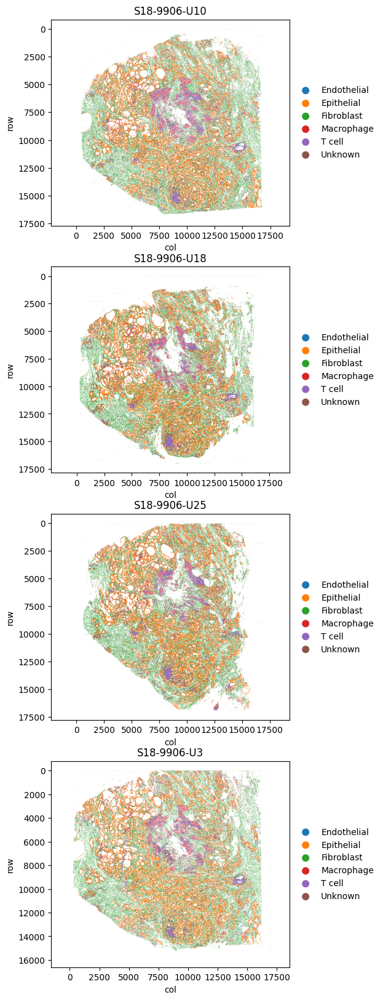

In [217]:
fig, axs = plt.subplots(nrows=len(sids), figsize=(5, 5 * len(sids)))
if len(sids) < 2:
    axs = [axs]
for sid, ax in zip(sids, axs):
    f = adata[adata.obs['sid']==sid]
    sc.pl.scatter(f, x='col', y='row', color='cell_type', ax=ax, show=False)
    ax.axis('equal')
    ax.invert_yaxis()
    ax.set_title(sid)
plt.savefig(output_dir / f'{case}_sections.svg')

In [218]:
adata.write_h5ad(output_dir / f'{case}_cell_typed.h5ad')

#### HT565B1-H2

In [9]:
case = 'HT565B1-H2'

adata = sc.read_h5ad(output_dir / f'{case}_processed.h5ad')
adata

AnnData object with n_obs × n_vars = 68677 × 33
    obs: 'case', 'sid', 'label', 'row', 'col', 'bbox-r1', 'bbox-c1', 'bbox-r2', 'bbox-c2', 'cluster'
    var: 'mean', 'std'
    obsm: 'X_pca', 'X_pca_harmony'

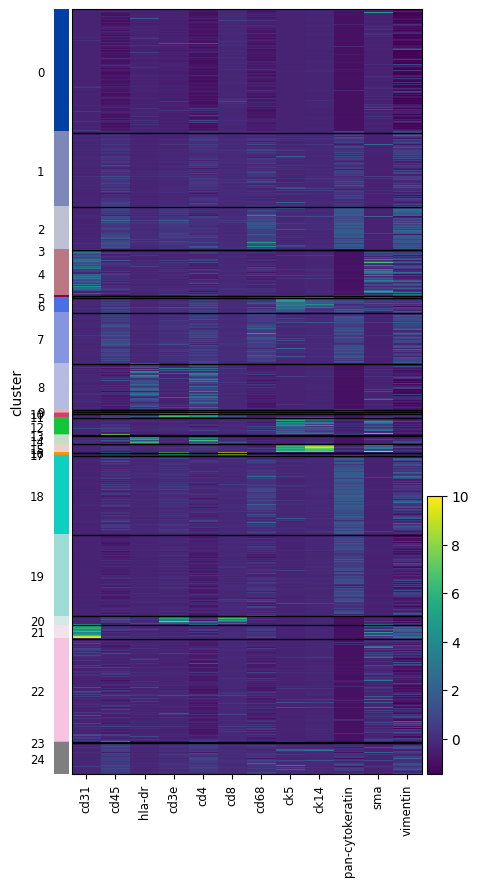

In [10]:
sc.pl.heatmap(adata, [g for g in genes if g in adata.var.index], groupby='cluster', vmax=10, figsize=(5, 10))

In [21]:
mapping = {
    'Epithelial': [1, 2, 7, 18, 19],
    'T cell': [10, 11, 20],
    'Fibroblast': [6, 12, 15, 22],
    'Macrophage': [8, 13, 14],
    'Endothelial': [4, 21],
    'Unknown': [0, 3, 5, 9, 16, 17, 22, 23, 24],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
adata.obs['cell_type'] = [r_mapping[int(x)] for x in adata.obs['cluster']]

In [22]:
sids = sorted(set(adata.obs['sid']))
sids

['HT565B1-H2']

/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


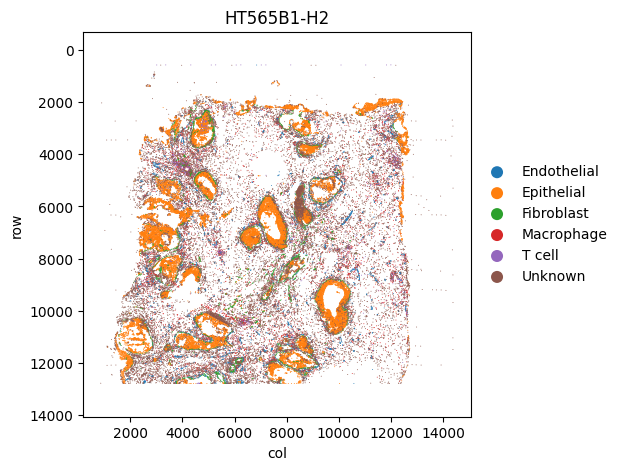

In [23]:
fig, axs = plt.subplots(nrows=len(sids), figsize=(5, 5 * len(sids)))
if len(sids) < 2:
    axs = [axs]
for sid, ax in zip(sids, axs):
    f = adata[adata.obs['sid']==sid]
    sc.pl.scatter(f, x='col', y='row', color='cell_type', ax=ax, show=False)
    ax.axis('equal')
    ax.invert_yaxis()
    ax.set_title(sid)
plt.savefig(output_dir / f'{case}_sections.svg')

In [24]:
adata.write_h5ad(output_dir / f'{case}_cell_typed.h5ad')